<h2>
<font color = 'red'>Note</font>: To start working<br><br>
<font color = 'gold'>In Colab</font>: upload the "video_03m" file <br> to the directory in which the "sample_data" folder lies <br><br>  
<font color = 'gold'>On a local machine</font>: upload the "video_03m" file <br> to the directory this Jupyter Notebook is in
<h2>

In [16]:
pip install gdown

In [17]:
import gdown
url = 'https://drive.google.com/uc?export=download&id=1WnIVh-a_I1x8qn-OrTkWy19_IYeX72Sn'
output = 'video_03m.xlsm'

gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&id=1WnIVh-a_I1x8qn-OrTkWy19_IYeX72Sn
To: /content/video_03m.xlsm
100%|██████████| 4.23M/4.23M [00:00<00:00, 188MB/s]


'video_03m.xlsm'

In [18]:
import numpy as np
import matplotlib as mpl
from matplotlib import rc
rc('animation', html='jshtml')

In [19]:
import matplotlib.pyplot as plt

import pandas as pd

file_path = 'video_03m.xlsm'

xlsm = pd.read_excel(file_path, sheet_name=None, engine='openpyxl')

for sheet_name, df in xlsm.items():
    print(f"Sheet Name: {sheet_name}")
    #print(df)  # Display the DataFrame for each sheet

Sheet Name: video_03
Sheet Name: video
Sheet Name: один проход
Sheet Name: оп2
Sheet Name: Лист1
Sheet Name: Experimentation


/usr/local/lib/python3.10/dist-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Web Extension extension is not supported and will be removed
  warn(msg)


In [20]:
mpl.rcParams['animation.embed_limit'] = 2**128
plt.style.use('dark_background')
plt.rcParams['axes.edgecolor'] = 'black'

In [21]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [22]:
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

In [23]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(0, 570)  # what frames to show
fix_limits = True

hardlim = resolution_x // 2  # limit axes (set manually)
offset = resolution_x // 2  # center of the picture offset (set manually)


ratio = resolution_x / resolution_y

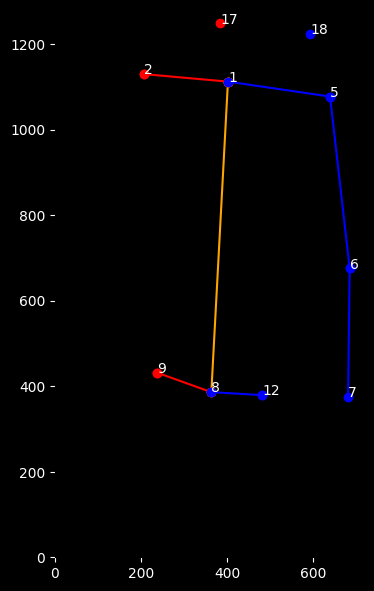

In [24]:
#@title Animation, for reference
size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)
xdfcp += resolution_x
ydfcp += resolution_y

prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])
    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations

# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')

Note: the animation may take up to a couple of minutes to render

In [25]:
ani

<h4> Distance distortion seems to be present </h4>

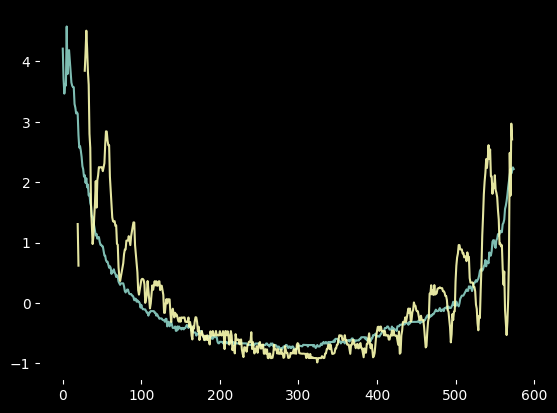

In [26]:
# Evidence No1
dist_points = ((1, 8), (13, 14))
for elem in dist_points:
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0}' if p0  < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
                + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
    dists = (dists - dists.mean()) / np.sqrt(dists.var())

    plt.plot(dists, alpha=0.9)
plt.show()

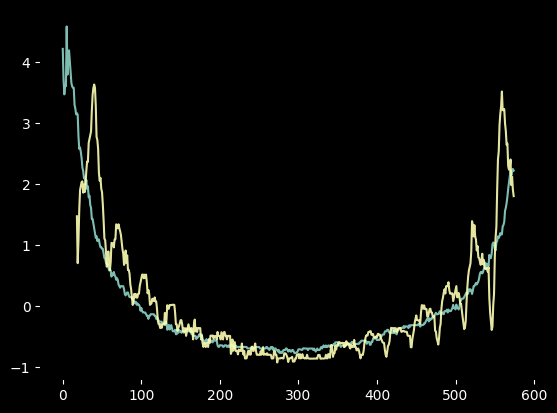

In [27]:
# Evidence No2
dist_points = ((1, 8), (10, 11))
for elem in dist_points:
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0}' if p0  < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    dists = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
                + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
    dists = (dists - dists.mean()) / np.sqrt(dists.var())

    plt.plot(dists, alpha=0.9)
plt.show()

Ratio:

In [28]:
dist_points = ((1, 8), (13, 14))

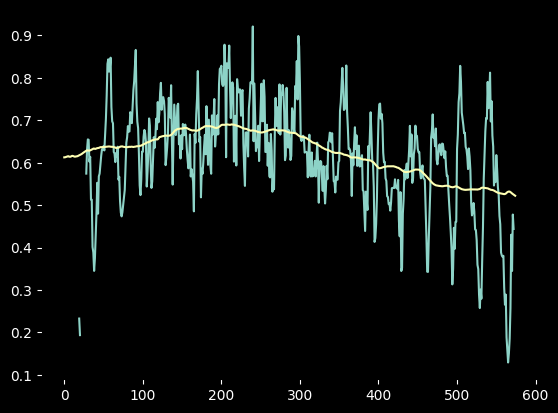

In [29]:
elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists1 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists2 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)

plt.plot(dists2 / dists1)
plt.plot((dists2 / dists1).rolling(200, center=True, min_periods=1).mean())
plt.show()

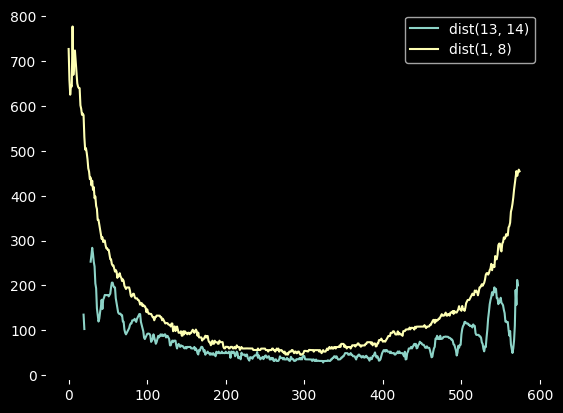

In [30]:
plt.plot(dists2, label=f'dist{dist_points[1]}')
plt.plot(dists1, label=f'dist{dist_points[0]}')
plt.legend()
plt.show()

Clearly, trend is not a straight line, as we would want

Interesting sources: <br>
[One](https://photo.stackexchange.com/questions/53623/why-the-faces-in-the-corner-tends-to-skew-a-bit-in-almost-all-smartphone-cameras) <br>
[Two](https://stackoverflow.com/questions/67008814/calculate-and-use-inverse-of-opencv-distortion-parameters) <br>
[Three (research paper)](https://researchgate.net/figure/In-the-FOV-distortion-model-the-distance-cm-is-proportional-to-the-angle-between-CM_fig2_29638148/) <br>
[Four](https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html)

We try to correct for **radial distortion** (most likely there's a bit of barrel distortion) and **tangential distortion**, which the phenomenon seems to be. <br>
There are no calibration images, therefore the solution is to try to compare the similarity between the available distances

In [31]:
url = 'https://drive.google.com/uc?export=download&id=1pgk3W2NEjQlM-l-_mSZ77RdMxlOlclyW'
output = 'chess.png'
gdown.download(url, output, quiet=False)

url = 'https://drive.google.com/uc?export=download&id=1pE4O_-4yUvZqmPrT8fhW3lVhSie0hi8z'
output = 'dots.png'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&id=1pgk3W2NEjQlM-l-_mSZ77RdMxlOlclyW
To: /content/chess.png
100%|██████████| 17.3k/17.3k [00:00<00:00, 28.7MB/s]
Downloading...
From: https://drive.google.com/uc?export=download&id=1pE4O_-4yUvZqmPrT8fhW3lVhSie0hi8z
To: /content/dots.png
100%|██████████| 74.7k/74.7k [00:00<00:00, 64.3MB/s]


'dots.png'

In [32]:
import cv2

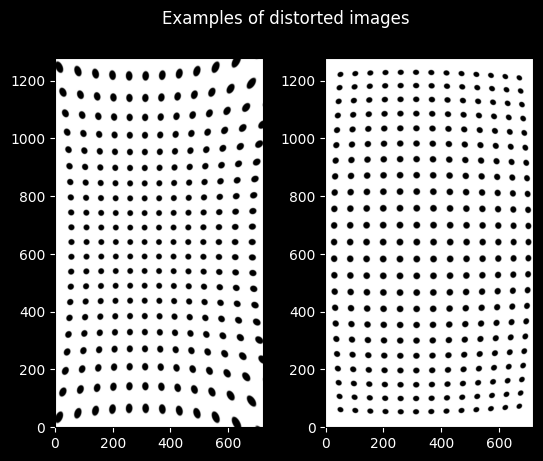

In [33]:
import numpy as np
import cv2
fig, axes = plt.subplots(ncols=2)

src    = cv2.imread("dots.png")
width  = src.shape[1]
height = src.shape[0]

distCoeff = np.zeros((4,1),np.float64)

# TODO: add your coefficients here!
k1 = -0.00004 # negative to remove barrel distortion
k2 = 0.0
p1 = 0
p2 = -0.0003

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width/2.0  # define center x
cam[1,2] = height/2.0 # define center y
cam[0,0] = 10.        # define focal length x
cam[1,1] = 10.        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)
cv2.imwrite("dotsmodified1.png", dst)
axes[0].imshow(dst, origin='lower')

# Second one
k1 = 0.00004 # negative to remove barrel distortion
k2 = 0.0
p1 = 0
p2 = 0.0003

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width/2.0  # define center x
cam[1,2] = height/2.0 # define center y
cam[0,0] = 10.        # define focal length x
cam[1,1] = 10.        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

cv2.imwrite("dotsmodified2.png", dst)
axes[1].imshow(dst, origin='lower')

fig.suptitle('Examples of distorted images')
plt.show()

The undistortion process involves searching for coefficients that minimize the distortion

In [34]:
import numpy as np
import cv2

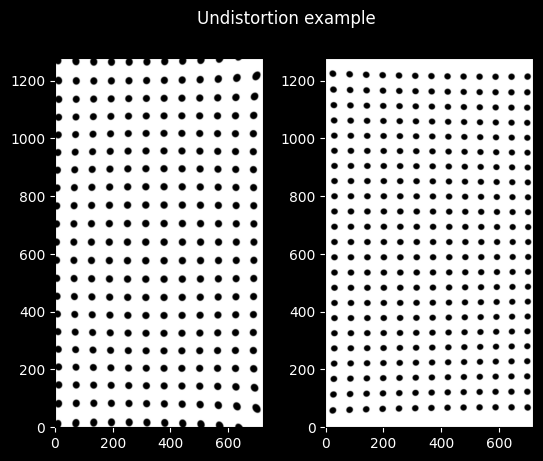

In [35]:
fig, axes = plt.subplots(ncols=2)

src    = cv2.imread("dotsmodified1.png")
width  = src.shape[1]
height = src.shape[0]

distCoeff = np.zeros((4,1),np.float64)

# TODO: add your coefficients here!
k1 = 0.00008 # negative to remove barrel distortion
k2 = 0
p1 = 0
p2 = 0.0004

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width/2.0  # define center x
cam[1,2] = height/2.0 # define center y
cam[0,0] = 10.        # define focal length x
cam[1,1] = 10.        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

axes[0].imshow(dst, origin='lower')

# Second one
src    = cv2.imread("dotsmodified2.png")
width  = src.shape[1]
height = src.shape[0]

distCoeff = np.zeros((4,1),np.float64)

k1 = -0.00002 # negative to remove barrel distortion
k2 = 0.0
p1 = 0
p2 = -0.00003

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width/2.0  # define center x
cam[1,2] = height/2.0 # define center y
cam[0,0] = 10.        # define focal length x
cam[1,1] = 10.        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

axes[1].imshow(dst, origin='lower')

fig.suptitle('Undistortion example')
plt.show()

Now let's compare the before and the after

In [36]:
src = cv2.imread("dots.png")

In [37]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(500, 570)  # what frames to show
fix_limits = True

hardlim = resolution_x // 2  # limit axes (set manually)
offset = resolution_x // 2  # center of the picture offset (set manually)

ratio = resolution_x / resolution_y

k1 = -0.0000003
k2 = 0
p1 = 0
p2 = 0

<h4> In the example below the background shows what kind of distortion is applied to the points of the skeletal model </h4>

In [ ]:
#@title (Un)distorted animation
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)
xdfcp += resolution_x
ydfcp += resolution_y

width  = 720
height = 1280

############# DISTORTION PART ################

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = 1        # define focal length x
cam[1,1] = 1        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

ax.imshow(dst, origin='lower', alpha=0.2)

original_points = np.stack((xdfcp, ydfcp), axis=-1)
original_points = np.ascontiguousarray(original_points)

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

################################################################
prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])

    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations


# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')

In [ ]:
ani

Pincushion distortion will be used to minimize barrel distortion

We try to minimize radial/perspective distortion by searching for optimal coefficients, comparing the similarity of the distances. In the diagrams shown above the ankle distance is clearly not proportional to the body height: it changes with the subject changing their position relative to the camera

In [40]:
dist_points = ((1, 8), (10, 11))

<font color='crimson'>Before undistortion</font>

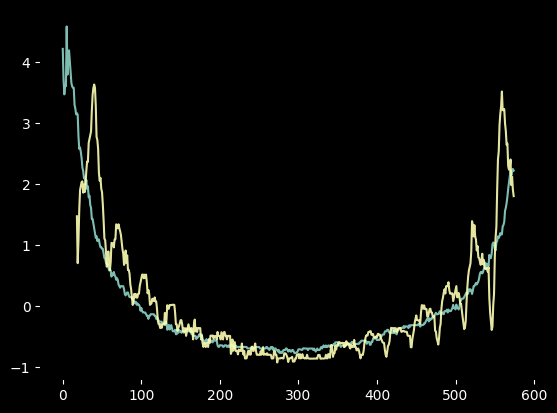

In [41]:
#@title Show code
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y


elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists1 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists1 = (dists1 - dists1.mean()) / np.sqrt(dists1.var())

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists2 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists2 = (dists2 - dists2.mean()) / np.sqrt(dists2.var())


plt.plot(dists1, alpha=0.9)
plt.plot(dists2, alpha=0.9)
plt.show()

<font color='lime'>After undistortion</font>

In [42]:
k1 = -0.0000003
k2 = 0
p1 = 0
p2 = 0

<ipython-input-43-5be1fe480463>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]


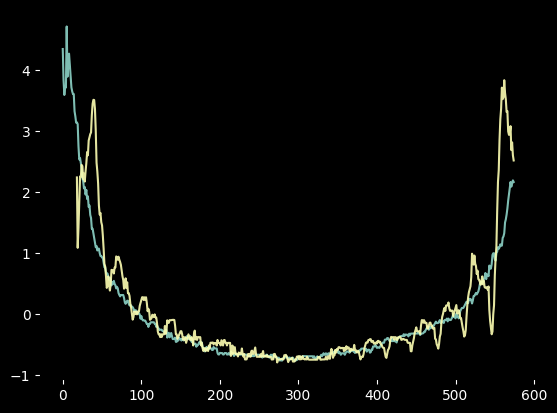

In [43]:
#@title Show code
frames_of_interest = df2['frame_id']
frames_range=range(len(df2['frame_id']))
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = 1.        # define focal length x
cam[1,1] = 1.        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

original_points = np.stack((xdfcp, ydfcp), axis=-1)
original_points = np.ascontiguousarray(original_points)

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists3 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists3 = (dists3 - dists3.mean()) / np.sqrt(dists3.var())

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists4 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists4 = (dists4 - dists4.mean()) / np.sqrt(dists4.var())


plt.plot(dists3, alpha=0.9)
plt.plot(dists4, alpha=0.9)
plt.show()

df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

In [44]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [45]:
mask = ~np.isnan(dists1) & ~np.isnan(dists2)
print(f'MSE BEFORE: {mean_squared_error(dists1[mask], dists2[mask])}')
mask = ~np.isnan(dists3) & ~np.isnan(dists4)
print(f'MSE AFTER: {mean_squared_error(dists3[mask], dists4[mask])}')

MSE BEFORE: 0.25183370767497587
MSE AFTER: 0.22697252033455018


<h3> Clearly, the second image shows some improvement and the MSE improvement is present too.</h3>

The search space must defined so as it is adequate. For this purpose the focal length is taken constant as we're not interested in physical properties of the camera but rather in visible distortion.

In [46]:
dists_points = (((1, 8), (13, 14)), )

In [47]:
def get_metric(dist_points_elem, metric):
    xs = xdfcp.copy()
    ys = ydfcp.copy()
    for i in range(len(frames_range)):
        new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
        xs.iloc[frames_range[i]], ys.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

    elem = dist_points_elem[0]
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0}' if p0  < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    dists3 = np.sqrt((xs[f'x_{p0}'] - xs[f'x_{p1}'])**2 \
                + (ys[f'y_{p0}'] - ys[f'y_{p1}'])**2)
    dists3 = (dists3 - dists3.mean()) / np.sqrt(dists3.var())

    elem = dist_points_elem[1]
    p0 = elem[0]
    p1 = elem[1]
    p0 = f'0{p0}' if p0  < 10 else f'{p0}'
    p1 = f'0{p1}' if p1 < 10 else f'{p1}'
    dists4 = np.sqrt((xs[f'x_{p0}'] - xs[f'x_{p1}'])**2 \
                + (ys[f'y_{p0}'] - ys[f'y_{p1}'])**2)
    dists4 = (dists4 - dists4.mean()) / np.sqrt(dists4.var())

    del(xs)
    del(ys)
    # Calculate mean squared error
    mask = ~np.isnan(dists3) & ~np.isnan(dists4)
    score = metric(dists3[mask], dists4[mask])
    return score

In [48]:
#@title Search for the best coefs

from hyperopt import hp, fmin, tpe, rand, Trials

focal_len = 1
k2 = 0

frames_of_interest = df2['frame_id']
frames_range=range(len(df2['frame_id']))
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

# Define the search space for hyperparameters
space = {
    'k1': hp.uniform('k1', -0.000001, 0.000002),
    'p1': hp.uniform('p1', -0.0001, 0.0001),
    'p2': hp.uniform('p2', -0.0001, 0.0001)
}


# Define objective function for hyperparameter optimization
def objective(params):

    distCoeff = np.zeros((4,1),np.float64)

    distCoeff[0,0] = params['k1']
    distCoeff[1,0] = k2
    distCoeff[2,0] = params['p1']
    distCoeff[3,0] = params['p2']

    # assume unit matrix for camera
    cam = np.eye(3,dtype=np.float32)

    cam[0,2] = width / 2.0  # define center x
    cam[1,2] = height / 2.0 # define center y
    cam[0,0] = focal_len # define focal length x
    cam[1,1] = focal_len # define focal length y

    # here the undistortion will be computed
    newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))

    arrx = (xdfcp - resolution_x / 2) * (validPixROI[2]) / resolution_x + resolution_x / 2
    arry = (ydfcp - resolution_y / 2) * (validPixROI[3]) / resolution_y + resolution_y / 2

    original_points = np.stack((arrx, arry), axis=-1)
    original_points = np.ascontiguousarray(original_points)

    scores = []
    for pair_points in dists_points:
        scores.append(get_metric(pair_points, mean_absolute_error))
    return sum(scores) / len(scores)


# Perform hyperparameter optimization with nested cross-validation
trials = Trials()
best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=1000, trials=trials)

print("Best hyperparameters:", best_params)

100%|██████████| 1000/1000 [01:13<00:00, 13.57trial/s, best loss: 0.30103429454431396]
Best hyperparameters: {'k1': -2.1440075473885593e-07, 'p1': -3.484833300251611e-05, 'p2': 7.514717379540735e-05}


In [49]:
k1 = best_params['k1']
p1 = best_params['p1']
p2 = best_params['p2']

focal_len = 1
k2 = 0

<ipython-input-50-ca39688e7ca1>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]


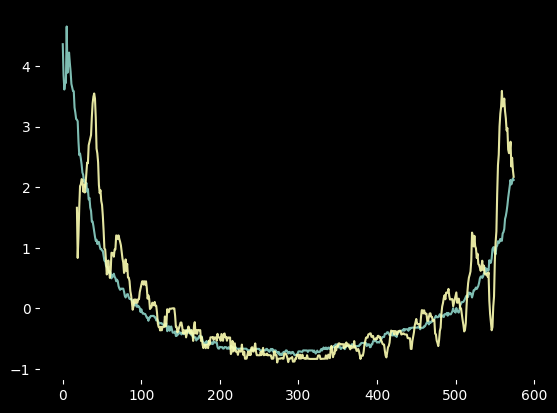

In [50]:
#@title Show code
frames_of_interest = df2['frame_id']
frames_range=range(len(df2['frame_id']))
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len # define focal length x
cam[1,1] = focal_len # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

ax.imshow(dst, origin='lower', alpha=0.2)

arrx = (xdfcp - resolution_x / 2) * (validPixROI[2]) / resolution_x + resolution_x / 2
arry = (ydfcp - resolution_y / 2) * (validPixROI[3]) / resolution_y + resolution_y / 2

original_points = np.stack((arrx, arry), axis=-1)
original_points = np.ascontiguousarray(original_points)

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists3 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists3 = (dists3 - dists3.mean()) / np.sqrt(dists3.var())

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists4 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists4 = (dists4 - dists4.mean()) / np.sqrt(dists4.var())


plt.plot(dists3, alpha=0.9)
plt.plot(dists4, alpha=0.9)
plt.show()

df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

As we choose the distortion based on only two pairs of points, the model obtained is not adequate. It is obvious from the visualization. <br>
Now we increase the complexity of the objective fucntion

In [51]:
dist_points = ((1, 8), (10, 9))
dists_points = (((1, 8), (13, 14)), ((1, 8), (10, 11)), ((1, 8), (12, 9)),
 ((2, 5), (12, 9)), ((1, 8), (12, 13)), ((1, 8), (9, 10)))

dists_points = (((1, 8), (10, 11)), ((1, 8), (9, 10)), ((1, 8), (12, 13)), ((1, 8), (13, 14)),)
n_evals = 200
metric = mean_absolute_error

In [52]:
#@title Search for the best coefs

from hyperopt import hp, fmin, tpe, rand, Trials

focal_len = 1
k2 = 0

frames_of_interest = df2['frame_id']
frames_range=range(len(df2['frame_id']))
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

# Define the search space for hyperparameters
space = {
    'k1': hp.uniform('k1', -0.0000005, 0.0000005),
    'p1': hp.uniform('p1', -0.000001, 0.000001),
    'p2': hp.uniform('p2', -0.000001, 0.000001)
}


# Define objective function for hyperparameter optimization
def objective(params):

    distCoeff = np.zeros((4,1),np.float64)

    distCoeff[0,0] = params['k1']
    distCoeff[1,0] = k2
    distCoeff[2,0] = params['p1']
    distCoeff[3,0] = params['p2']

    # assume unit matrix for camera
    cam = np.eye(3,dtype=np.float32)

    cam[0,2] = width / 2.0  # define center x
    cam[1,2] = height / 2.0 # define center y
    cam[0,0] = focal_len # define focal length x
    cam[1,1] = focal_len # define focal length y

    # here the undistortion will be computed
    newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))

    arrx = (xdfcp - resolution_x / 2) * (validPixROI[2]) / resolution_x + resolution_x / 2
    arry = (ydfcp - resolution_y / 2) * (validPixROI[3]) / resolution_y + resolution_y / 2

    original_points = np.stack((arrx, arry), axis=-1)
    original_points = np.ascontiguousarray(original_points)

    scores = []
    for pair_points in dists_points:
        scores.append(get_metric(pair_points, metric))
    return sum(scores) / len(scores)


# Perform hyperparameter optimization with nested cross-validation
trials = Trials()
best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=n_evals, trials=trials)

print("Best hyperparameters:", best_params)

100%|██████████| 200/200 [00:46<00:00,  4.31trial/s, best loss: 0.2339443307482909]
Best hyperparameters: {'k1': 2.5142833151827553e-07, 'p1': 7.350313116230824e-07, 'p2': 8.372362876493374e-07}


In [53]:
k1 = best_params['k1']
p1 = best_params['p1']
p2 = best_params['p2']

focal_len = 1
k2 = 0

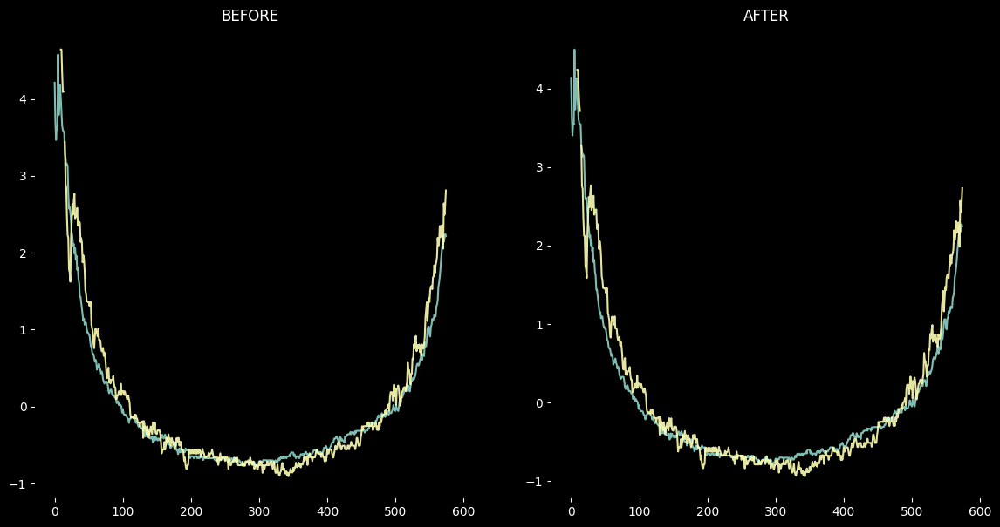

In [54]:
#@title Show code
fig, axes = plt.subplots(ncols=2, figsize=(14, 7))

frames_of_interest = df2['frame_id']
frames_range=range(len(df2['frame_id']))
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]
xdfcp += resolution_x
ydfcp += resolution_y

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len # define focal length x
cam[1,1] = focal_len # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 0, (width, height))

arrx = (xdfcp - resolution_x / 2) * (validPixROI[2]) / resolution_x + resolution_x / 2
arry = (ydfcp - resolution_y / 2) * (validPixROI[3]) / resolution_y + resolution_y / 2

original_points = np.stack((arrx, arry), axis=-1)
original_points = np.ascontiguousarray(original_points)

elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists3 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists3 = (dists3 - dists3.mean()) / np.sqrt(dists3.var())

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists4 = np.sqrt((xdfcp[f'x_{p0}'] - xdfcp[f'x_{p1}'])**2 \
            + (ydfcp[f'y_{p0}'] - ydfcp[f'y_{p1}'])**2)
dists4 = (dists4 - dists4.mean()) / np.sqrt(dists4.var())

axes[0].plot(dists3, alpha=0.9)
axes[0].plot(dists4, alpha=0.9)

xs, ys = xdfcp.copy(deep=True), ydfcp.copy(deep=True)

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xs.iloc[frames_range[i]], ys.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

elem = dist_points[0]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists3 = np.sqrt((xs[f'x_{p0}'] - xs[f'x_{p1}'])**2 \
            + (ys[f'y_{p0}'] - ys[f'y_{p1}'])**2)
dists3 = (dists3 - dists3.mean()) / np.sqrt(dists3.var())

elem = dist_points[1]
p0 = elem[0]
p1 = elem[1]
p0 = f'0{p0}' if p0  < 10 else f'{p0}'
p1 = f'0{p1}' if p1 < 10 else f'{p1}'
dists4 = np.sqrt((xs[f'x_{p0}'] - xs[f'x_{p1}'])**2 \
            + (ys[f'y_{p0}'] - ys[f'y_{p1}'])**2)
dists4 = (dists4 - dists4.mean()) / np.sqrt(dists4.var())

axes[1].plot(dists3, alpha=0.9)
axes[1].plot(dists4, alpha=0.9)

axes[0].set_title('BEFORE')
axes[1].set_title('AFTER')
plt.show()

In [55]:
fps = 30  # set manually
resolution_x, resolution_y = 720, 1280  # set manually
frames_range = range(500, 570)  # what frames to show
fix_limits = True
hardlim = resolution_x // 2  # limit axes (set manually)
offset = resolution_x // 2  # center of the picture offset (set manually)

ratio = resolution_x / resolution_y

k1 = best_params['k1']
p1 = best_params['p1']
p2 = best_params['p2']

k2 = 0
focal_len = 1 # It's constant

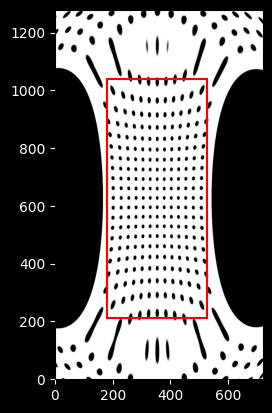

In [56]:
#@title Red zone is the valid pixels region
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Sample calibration parameters
k1 = -0.0000005
k2 = 0.0
p1 = -0.000001
p2 = -0.000001

distCoeff = np.zeros((4, 1), np.float64)
distCoeff[0, 0] = k1
distCoeff[1, 0] = k2
distCoeff[2, 0] = p1
distCoeff[3, 0] = p2

# Sample camera parameters
width = 720
height = 1280
cam = np.eye(3, dtype=np.float32)
cam[0, 2] = width / 2.0  # define center x
cam[1, 2] = height / 2.0  # define center y
cam[0, 0] = 1.0  # define focal length x
cam[1, 1] = 1.0  # define focal length y

# Generate a sample image
src = cv2.imread("dots.png")
# Compute new camera matrix and undistort image
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 1, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)

# Visualize rectified image and ROI
plt.imshow(dst, origin='lower')
plt.plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
plt.plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
plt.show()

In [ ]:
#@title (Un)distorted animation
df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)
xdfcp += resolution_x
ydfcp += resolution_y

width  = 720
height = 1280

############# DISTORTION PART ################

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len        # define focal length x
cam[1,1] = focal_len        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 1, (width, height))
dst = cv2.undistort(src, cam, distCoeff, None, newCam)
ax.imshow(dst, origin='lower', alpha=0.2)
ax.plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
ax.plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
ax.plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
ax.plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')

# We need them all within the valid ROI
arrx = (xdfcp - resolution_x / 2) * (validPixROI[2] - ratio) / resolution_x + resolution_x / 2
arry = (ydfcp - resolution_y / 2) * (validPixROI[3] - 1) / resolution_y + resolution_y / 2

original_points = np.stack((arrx, arry), axis=-1)
original_points = np.ascontiguousarray(original_points)

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]

################################################################
prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])

    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations



# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')


In [ ]:
ani

In [59]:
#@title Helper functions
import numpy as np

def bilinear_inverse(p, vertices, numiter=4):
    """
    Compute the inverse of the bilinear map from the unit square
    [(0,0), (1,0), (1,1), (0,1)]
    to the quadrilateral vertices = [p0, p1, p2, p4]

    Parameters:
    ----------
    p: array of shape (2, ...)
        Points on which the inverse transforms are applied.
    vertices: array of shape (4, 2, ...)
        Coordinates of the vertices mapped to the unit square corners
    numiter:
        Number of Newton interations

    Returns:
    --------
    s: array of shape (2, ...)
        Mapped points.

    This is a (more general) python implementation of the matlab implementation
    suggested in https://stackoverflow.com/a/18332009/1560876
    """

    p = np.asarray(p)
    v = np.asarray(vertices)
    sh = p.shape[1:]
    if v.ndim == 2:
        v = np.expand_dims(v, axis=tuple(range(2, 2 + len(sh))))

    # Start in the center
    s = .5 * np.ones((2,) + sh)
    s0, s1 = s
    for k in range(numiter):
        # Residual
        r = v[0] * (1 - s0) * (1 - s1) + v[1] * s0 * (1 - s1) + v[2] * s0 * s1 + v[3] * (1 - s0) * s1 - p

        # Jacobian
        J11 = -v[0, 0] * (1 - s1) + v[1, 0] * (1 - s1) + v[2, 0] * s1 - v[3, 0] * s1
        J21 = -v[0, 1] * (1 - s1) + v[1, 1] * (1 - s1) + v[2, 1] * s1 - v[3, 1] * s1
        J12 = -v[0, 0] * (1 - s0) - v[1, 0] * s0 + v[2, 0] * s0 + v[3, 0] * (1 - s0)
        J22 = -v[0, 1] * (1 - s0) - v[1, 1] * s0 + v[2, 1] * s0 + v[3, 1] * (1 - s0)

        inv_detJ = 1. / (J11 * J22 - J12 * J21)

        s0 -= inv_detJ * (J22 * r[0] - J12 * r[1])
        s1 -= inv_detJ * (-J21 * r[0] + J11 * r[1])

    return s


def invert_map(xmap, ymap, diagnostics=False):
    """
    Generate the inverse of deformation map defined by (xmap, ymap) using inverse bilinear interpolation.
    """

    # Generate quadrilaterals from mapped grid points.
    quads = np.array([[ymap[:-1, :-1], xmap[:-1, :-1]],
                      [ymap[1:, :-1], xmap[1:, :-1]],
                      [ymap[1:, 1:], xmap[1:, 1:]],
                      [ymap[:-1, 1:], xmap[:-1, 1:]]])

    # Range of indices possibly within each quadrilateral
    x0 = np.floor(quads[:, 1, ...].min(axis=0)).astype(int)
    x1 = np.ceil(quads[:, 1, ...].max(axis=0)).astype(int)
    y0 = np.floor(quads[:, 0, ...].min(axis=0)).astype(int)
    y1 = np.ceil(quads[:, 0, ...].max(axis=0)).astype(int)

    # Quad indices
    i0, j0 = np.indices(x0.shape)

    # Offset of destination map
    x0_offset = x0.min()
    y0_offset = y0.min()

    # Index range in x and y (per quad)
    xN = x1 - x0 + 1
    yN = y1 - y0 + 1

    # Shape of destination array
    sh_dest = (1 + x1.max() - x0_offset, 1 + y1.max() - y0_offset)

    # Coordinates of destination array
    yy_dest, xx_dest = np.indices(sh_dest)

    xmap1 = np.zeros(sh_dest)
    ymap1 = np.zeros(sh_dest)
    TN = np.zeros(sh_dest, dtype=int)

    # Smallish number to avoid missing point lying on edges
    epsilon = .01

    # Loop through indices possibly within quads
    for ix in range(xN.max()):
        for iy in range(yN.max()):
            # Work only with quads whose bounding box contain indices
            valid = (xN > ix) * (yN > iy)

            # Local points to check
            p = np.array([y0[valid] + ix, x0[valid] + iy])

            # Map the position of the point in the quad
            s = bilinear_inverse(p, quads[:, :, valid])

            # s out of unit square means p out of quad
            # Keep some epsilon around to avoid missing edges
            in_quad = np.all((s > -epsilon) * (s < (1 + epsilon)), axis=0)

            # Add found indices
            ii = p[0, in_quad] - y0_offset
            jj = p[1, in_quad] - x0_offset

            ymap1[ii, jj] += i0[valid][in_quad] + s[0][in_quad]
            xmap1[ii, jj] += j0[valid][in_quad] + s[1][in_quad]

            # Increment count
            TN[ii, jj] += 1

    ymap1 /= TN + (TN == 0)
    xmap1 /= TN + (TN == 0)

    if diagnostics:
        diag = {'x_offset': x0_offset,
                'y_offset': y0_offset,
                'mask': TN > 0}
        return xmap1, ymap1, diag
    else:
        return xmap1, ymap1

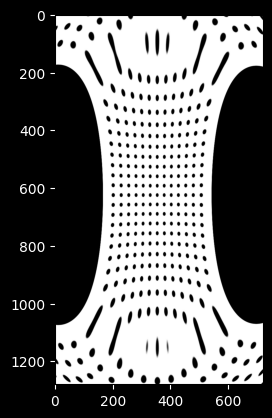

In [60]:
import cv2 as cv
from scipy import ndimage as ndi

width  = 720
height = 1280

############# DISTORTION PART ################

distCoeff = np.zeros((4,1),np.float64)

distCoeff[0,0] = k1
distCoeff[1,0] = k2
distCoeff[2,0] = p1
distCoeff[3,0] = p2

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len        # define focal length x
cam[1,1] = focal_len        # define focal length y

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 1, (width, height))
# Simulate deformation field
img = cv2.imread('dots.png')
sh = img.shape[:2]

# Apply forward mapping
xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeff, None, newCam, (width, height), cv2.CV_32FC1)
warped = cv.remap(img, xmap, ymap ,cv.INTER_LINEAR)
plt.imshow(warped, cmap='gray')
plt.show()

In [ ]:
import cv2 as cv
from scipy import ndimage as ndi
import numpy as np
from matplotlib import pyplot as plt


distCoeffs = np.zeros((4, 1), np.float64)
distCoeffs[0, 0] = -0.0000001
distCoeffs[1, 0] = 0
distCoeffs[2, 0] = 0.0001
distCoeffs[3, 0] = -0.0002

cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len # define focal length x
cam[1,1] = focal_len # define focal length y

img = cv2.imread('dots.png')
sh = img.shape[:2]

# Apply forward mapping
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
#warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

plt.plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
plt.plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
plt.imshow(warped, cmap='gray')
plt.show()

def invert_map(F: np.ndarray):
    I = np.zeros_like(F)
    I[:,:,1], I[:,:,0] = np.indices(sh)
    P = np.copy(I)
    for i in range(10):
        P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
    return P

# F: The function to invert
F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
F[:,:,0], F[:,:,1] = (xmap, ymap)


# Test the prediction
unwarped = cv.remap(warped, invert_map(F), None, cv.INTER_LINEAR)
plt.imshow(unwarped, cmap='gray')
plt.plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
plt.plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
plt.show()

In [63]:
def get_new_points(points):
    # Use mapx and mapy to get the new coordinates
    new_points_x = xmap[points[:, 0], points[:, 1]]
    new_points_y = ymap[points[:, 0], points[:, 1]]

    # Combine new x and y coordinates into a single array
    new_points = np.column_stack((new_points_x, new_points_y))
    return np.array(new_points)

In [64]:
validPixROI

(0, 0, 719, 1279)

In [65]:
points = get_new_points(np.array([[validPixROI[0], validPixROI[1]], [validPixROI[1] + validPixROI[3], validPixROI[0]]]))

In [66]:
points

array([[  47.203022,   97.38304 ],
       [  19.629225, 1260.8118  ]], dtype=float32)

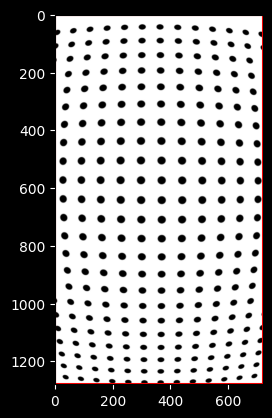

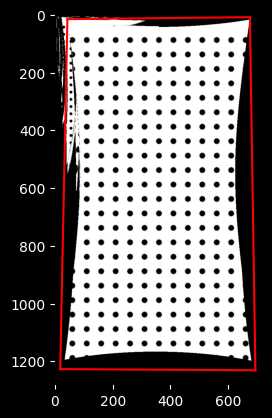

In [67]:
import cv2 as cv
from scipy import ndimage as ndi
import numpy as np
from matplotlib import pyplot as plt


distCoeffs = np.zeros((4, 1), np.float64)
distCoeffs[0, 0] = 0.000001
distCoeffs[1, 0] = 0
distCoeffs[2, 0] = 0.0001
distCoeffs[3, 0] = 0.00002

cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len # define focal length x
cam[1,1] = focal_len # define focal length y

img = cv2.imread('dots.png')
sh = img.shape[:2]

# Apply forward mapping
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
#warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

plt.plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
plt.plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
plt.plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
plt.imshow(warped, cmap='gray')
plt.show()


def invert_map(F: np.ndarray):
    I = np.zeros_like(F)
    I[:,:,1], I[:,:,0] = np.indices(sh)
    P = np.copy(I)
    for i in range(10):
        P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
    return P

# F: The function to invert
F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
F[:,:,0], F[:,:,1] = (xmap, ymap)


# Test the prediction
unwarped = cv.remap(warped, invert_map(F), None, cv.INTER_LINEAR)
plt.imshow(unwarped, cmap='gray')

newmap = invert_map(F)
invx, invy = newmap[:,:,0], newmap[:,:,1]
def get_new_plots(ar1, ar2):
    def map_xy(pointx, pointy):
        return xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]
    ar1 = np.array(ar1)
    ar2 = np.array(ar2)
    arr1 = np.array([0, 0])
    arr2 = np.array([0, 0])
    arr1[0], arr2[0] = map_xy(ar1[0], ar2[0])
    arr1[1], arr2[1] = map_xy(ar1[1], ar2[1])
    return arr1, arr2

plt.plot(*get_new_plots([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]]), color='red')
plt.plot(*get_new_plots([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]]), color='red')
plt.show()

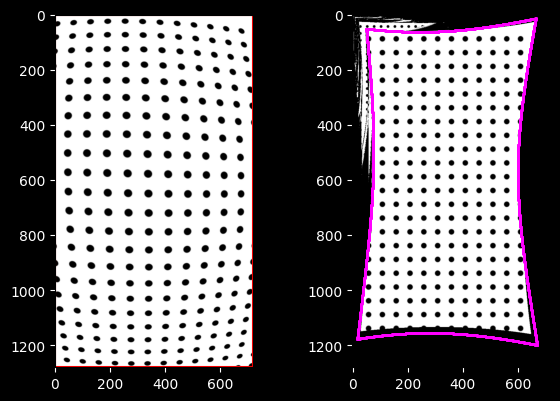

In [249]:
#@title Enhanced anomaly avoidance mapping (new borders shown in magenta)
distCoeffs = np.zeros((4, 1), np.float64)
distCoeffs[0, 0] = 0.000001
distCoeffs[1, 0] = 0
distCoeffs[2, 0] = 0.0001
distCoeffs[3, 0] = 0.0001

fig, axes = plt.subplots(nrows=1, ncols=2)
plt.subplots_adjust(wspace=0.5)

cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len # define focal length x
cam[1,1] = focal_len # define focal length y

img = cv2.imread('dots.png')
sh = img.shape[:2]

# Apply forward mapping
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
#warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

axes[0].plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
axes[0].plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
axes[0].plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
axes[0].plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
axes[0].imshow(warped, cmap='gray')


def invert_map(F: np.ndarray):
    I = np.zeros_like(F)
    I[:,:,1], I[:,:,0] = np.indices(sh)
    P = np.copy(I)
    for i in range(10):
        P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
    return P

# F: The function to invert
F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
F[:,:,0], F[:,:,1] = (xmap, ymap)


# Test the prediction
unwarped = cv.remap(warped, invert_map(F), None, cv.INTER_LINEAR)
axes[1].imshow(unwarped, cmap='gray')

newmap = invert_map(F)
invx, invy = newmap[:,:,0], newmap[:,:,1]
def get_new_plots(ar1, ar2):
    def map_xy(pointx, pointy):
        return xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]
    ar1 = np.array(ar1)
    ar2 = np.array(ar2)
    arr1 = np.array([0, 0])
    arr2 = np.array([0, 0])
    arr1[0], arr2[0] = map_xy(ar1[0], ar2[0])
    arr1[1], arr2[1] = map_xy(ar1[1], ar2[1])
    return arr1, arr2

def map_xy(pointx, pointy):
        return [xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]]

wallx = np.arange(validPixROI[0], validPixROI[0] + validPixROI[2] + 1)
wally = np.arange(validPixROI[1], validPixROI[1] + validPixROI[3] + 1)

#####
'''
mesh = np.array(np.meshgrid(wallx, wally))
mesh = np.transpose(mesh, (1, 2, 0))
mesharr = np.array([[map_xy(int(mesh[i, j, 0]), int(mesh[i, j, 1]))] for i in range(mesh.shape[0]) for j in range(mesh.shape[1])])
axes[1].scatter(np.ravel(mesharr[:, :, 0]), np.ravel(mesharr[:, :, 1]), s=0.33, color='blue')
'''
###

tst = np.vstack([wallx, np.zeros(wallx.shape)]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
axes[1].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([np.zeros(wally.shape), wally]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
axes[1].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([np.zeros(wally.shape) + validPixROI[2], wally]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
axes[1].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([wallx, np.zeros(wallx.shape) + validPixROI[3]]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
axes[1].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

'''
plt.plot(*get_new_plots([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]]), color='red')
plt.plot(*get_new_plots([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
    [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]],
    [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]]), color='red')
'''

plt.show()

In [ ]:
#@title Enhanced anomaly avoidance mapping (new borders shown in magenta) - ALL CORNER CASES

fig, axes = plt.subplots(nrows=2, ncols=8, figsize=(20, 8))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for index, sublist in enumerate([[0.000002, 0, 0.0001, 0.0001], [0.000002, 0, -0.0001, 0.0001], [0.000002, 0, 0.0001, -0.0001], [0.000002, 0, -0.0001, -0.0001],
                   [-0.000001, 0, 0.0001, 0.0001], [-0.000001, 0, -0.0001, 0.0001], [-0.000001, 0, 0.0001, -0.0001], [-0.000001, 0, -0.0001, -0.0001]]):

    distCoeffs[0, 0] = sublist[0]
    distCoeffs[1, 0] = sublist[1]
    distCoeffs[2, 0] = sublist[2]
    distCoeffs[3, 0] = sublist[3]

    cam = np.eye(3,dtype=np.float32)

    cam[0,2] = width / 2.0  # define center x
    cam[1,2] = height / 2.0 # define center y
    cam[0,0] = focal_len # define focal length x
    cam[1,1] = focal_len # define focal length y

    img = cv2.imread('dots.png')
    sh = img.shape[:2]

    # Apply forward mapping
    newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
    xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
    #warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
    warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

    axes[0, index].plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
    axes[0, index].plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
        [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
        [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].imshow(warped, cmap='gray')


    def invert_map(F: np.ndarray):
        I = np.zeros_like(F)
        I[:,:,1], I[:,:,0] = np.indices(sh)
        P = np.copy(I)
        for i in range(10):
            P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
        return P

    # F: The function to invert
    F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
    F[:,:,0], F[:,:,1] = (xmap, ymap)


    # Test the prediction
    unwarped = cv.remap(warped, invert_map(F), None, cv.INTER_LINEAR)
    axes[1, index].imshow(unwarped, cmap='gray')

    newmap = invert_map(F)
    invx, invy = newmap[:,:,0], newmap[:,:,1]
    def get_new_plots(ar1, ar2):
        def map_xy(pointx, pointy):
            return xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]
        ar1 = np.array(ar1)
        ar2 = np.array(ar2)
        arr1 = np.array([0, 0])
        arr2 = np.array([0, 0])
        arr1[0], arr2[0] = map_xy(ar1[0], ar2[0])
        arr1[1], arr2[1] = map_xy(ar1[1], ar2[1])
        return arr1, arr2

    def map_xy(pointx, pointy):
            return [xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]]

    wallx = np.arange(validPixROI[0], validPixROI[0] + validPixROI[2] + 1)
    wally = np.arange(validPixROI[1], validPixROI[1] + validPixROI[3] + 1)

    tst = np.vstack([wallx, np.zeros(wallx.shape)]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([np.zeros(wally.shape), wally]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([np.zeros(wally.shape) + validPixROI[2], wally]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([wallx, np.zeros(wallx.shape) + validPixROI[3]]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    '''
    plt.plot(*get_new_plots([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
    plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]]), color='red')
    plt.plot(*get_new_plots([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
        [validPixROI[1], validPixROI[1] + validPixROI[3]]), color='red')
    plt.plot(*get_new_plots([validPixROI[0], validPixROI[0] + validPixROI[2]],
        [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]]), color='red')
    '''

plt.show()

fig, axes = plt.subplots(nrows=2, ncols=8, figsize=(20, 8))
plt.subplots_adjust(wspace=0.5, hspace=0.5)

for index, sublist in enumerate([[0.000002, 0, 0.0001, 0.0001], [0.000002, 0, -0.0001, 0.0001], [0.000002, 0, 0.0001, -0.0001], [0.000002, 0, -0.0001, -0.0001],
                   [-0.000001, 0, 0.0001, 0.0001], [-0.000001, 0, -0.0001, 0.0001], [-0.000001, 0, 0.0001, -0.0001], [-0.000001, 0, -0.0001, -0.0001]]):

    distCoeffs[0, 0] = sublist[0]
    distCoeffs[1, 0] = sublist[1]
    distCoeffs[2, 0] = sublist[2]
    distCoeffs[3, 0] = sublist[3]

    cam = np.eye(3,dtype=np.float32)

    cam[0,2] = width / 2.0  # define center x
    cam[1,2] = height / 2.0 # define center y
    cam[0,0] = focal_len # define focal length x
    cam[1,1] = focal_len # define focal length y

    img = cv2.imread('chess.png')
    sh = img.shape[:2]

    # Apply forward mapping
    newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
    xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
    #warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
    warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

    axes[0, index].plot([validPixROI[0], validPixROI[0]], [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].plot([validPixROI[0], validPixROI[0] + validPixROI[2]], [validPixROI[1], validPixROI[1]], color='red')
    axes[0, index].plot([validPixROI[0] + validPixROI[2], validPixROI[0] + validPixROI[2]],
        [validPixROI[1], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].plot([validPixROI[0], validPixROI[0] + validPixROI[2]],
        [validPixROI[1] + validPixROI[3], validPixROI[1] + validPixROI[3]], color='red')
    axes[0, index].imshow(warped, cmap='gray')


    def invert_map(F: np.ndarray):
        I = np.zeros_like(F)
        I[:,:,1], I[:,:,0] = np.indices(sh)
        P = np.copy(I)
        for i in range(10):
            P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
        return P

    # F: The function to invert
    F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
    F[:,:,0], F[:,:,1] = (xmap, ymap)


    # Test the prediction
    unwarped = cv.remap(warped, invert_map(F), None, cv.INTER_LINEAR)
    axes[1, index].imshow(unwarped, cmap='gray')

    newmap = invert_map(F)
    invx, invy = newmap[:,:,0], newmap[:,:,1]

    def map_xy(pointx, pointy):
            return [xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]]

    wallx = np.arange(validPixROI[0], validPixROI[0] + validPixROI[2] + 1)
    wally = np.arange(validPixROI[1], validPixROI[1] + validPixROI[3] + 1)

    tst = np.vstack([wallx, np.zeros(wallx.shape)]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([np.zeros(wally.shape), wally]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([np.zeros(wally.shape) + validPixROI[2], wally]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

    tst = np.vstack([wallx, np.zeros(wallx.shape) + validPixROI[3]]).T
    tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
    axes[1, index].scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

plt.show()

The algorithm seems to be robust. But fixing distortions that are even more severe than shown on the pictures above may be not very practical as it can cause other anomalies. It can be fixed too though, but requires other algorithms

In [ ]:
#@title (Un)distorted animation
img = cv2.imread("dots.png")

df2 = xlsm['оп2']
x_df2 = -df2.filter(regex='x_')
y_df2 = -df2.filter(regex='y_')
c_df2 = -df2.filter(regex='c_')
xdfcp = x_df2.iloc[:, 0:25]
ydfcp = y_df2.iloc[:, 0:25]

size = 4
fig, ax = plt.subplots(figsize=(size * ratio, size) if ratio > 1 else (size, size * 1 / ratio))
# scatter = ax.scatter([], [], color='orange')
# ax.set_xlim(xdfcp.dropna().values.min() - 1, xdfcp.dropna().values.max() + 1)
# ax.set_ylim(ydfcp.dropna().values.min() - 1, ydfcp.dropna().values.max() + 1)
ax.set_xlim(-hardlim + offset, hardlim + offset)
ax.set_ylim((-hardlim + offset) / ratio, (hardlim + offset) / ratio)
xdfcp += resolution_x
ydfcp += resolution_y

width  = 720
height = 1280

############# DISTORTION PART ################

distCoeffs[0, 0] = 0.000001
distCoeffs[1, 0] = 0
distCoeffs[2, 0] = 0.0001
distCoeffs[3, 0] = 0.0001

# assume unit matrix for camera
cam = np.eye(3,dtype=np.float32)

cam[0,2] = width / 2.0  # define center x
cam[1,2] = height / 2.0 # define center y
cam[0,0] = focal_len        # define focal length x
cam[1,1] = focal_len        # define focal length y

newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeffs, (width, height), 0, (width, height))
xmap, ymap = cv2.initUndistortRectifyMap(cam, distCoeffs, None, newCam, (width, height), cv2.CV_32FC1)
#warped = cv2.remap(img, xmap, ymap, cv.INTER_LINEAR)
warped = cv2.undistort(img, cam, distCoeffs, None, newCam)

def invert_map(F: np.ndarray):
    I = np.zeros_like(F)
    I[:,:,1], I[:,:,0] = np.indices(sh)
    P = np.copy(I)
    for i in range(10):
        P += I - cv.remap(F, P, None, interpolation=cv.INTER_LINEAR)
    return P

# F: The function to invert
F = np.zeros((sh[0], sh[1], 2), dtype=np.float32)
F[:,:,0], F[:,:,1] = (xmap, ymap)

def map_xy(pointx, pointy):
        return [xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]]

wallx = np.arange(validPixROI[0], validPixROI[0] + validPixROI[2] + 1)
wally = np.arange(validPixROI[1], validPixROI[1] + validPixROI[3] + 1)

tst = np.vstack([wallx, np.zeros(wallx.shape)]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
ax.scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([np.zeros(wally.shape), wally]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
ax.scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([np.zeros(wally.shape) + validPixROI[2], wally]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
ax.scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

tst = np.vstack([wallx, np.zeros(wallx.shape) + validPixROI[3]]).T
tstprp = np.array([map_xy(int(x), int(y)) for x, y in tst])
ax.scatter(tstprp.T[0], tstprp.T[1], s=1, color='magenta')

# here the undistortion will be computed
newCam, validPixROI = cv2.getOptimalNewCameraMatrix(cam, distCoeff, (width, height), 1, (width, height))
dst = cv2.undistort(img, cam, distCoeff, None, newCam)
ax.imshow(dst, origin='lower', alpha=0.2)

# We need them all within the valid ROI
arrx = (xdfcp - resolution_x / 2) * (validPixROI[2] - ratio) / resolution_x + resolution_x / 2
arry = (ydfcp - resolution_y / 2) * (validPixROI[3] - 1) / resolution_y + resolution_y / 2

original_points = np.stack((arrx, arry), axis=-1)
original_points = np.ascontiguousarray(original_points)

map_xy(pointx, pointy):
        return [xmap[np.round(pointy), np.round(pointx)], ymap[np.round(pointy), np.round(pointx)]]

for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]
'''
for i in range(len(frames_range)):
    new_points = cv2.undistortPoints(original_points[frames_range[i], :, :][np.newaxis, :, :], cam, distCoeff, P=newCam)
    xdfcp.iloc[frames_range[i]], ydfcp.iloc[frames_range[i]] = new_points[:, 0, 0], new_points[:, 0, 1]
'''
################################################################
prev_annotations = []
lines = []
def update(frame):

    global lines
    global prev_annotations
    for line in lines:
        line.remove()

    if not fix_limits:
        ax.set_xlim(np.nanmin(xdfcp.iloc[frame].values) - 20, np.nanmax(xdfcp.iloc[frame].values) + 20)
        ax.set_ylim(np.nanmin(ydfcp.iloc[frame].values) - 20, np.nanmax(ydfcp.iloc[frame].values) + 20)

    # left arm
    lines = []
    # for i in range(2, 5):
    for i in range(3, 5):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right arm
    '''
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    '''
    for i in range(6, 8):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # head
    prev_x = xdfcp.iloc[frame, 0]
    prev_y = ydfcp.iloc[frame, 0]
    x = xdfcp.iloc[frame, 1]
    y = ydfcp.iloc[frame, 1]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # spine
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 8]
    y = ydfcp.iloc[frame, 8]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='orange')
    lines.append(line)

    # pelvis -> left hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 9]
    y = ydfcp.iloc[frame, 9]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # pelvis -> right hip
    prev_x = xdfcp.iloc[frame, 8]
    prev_y = ydfcp.iloc[frame, 8]
    x = xdfcp.iloc[frame, 12]
    y = ydfcp.iloc[frame, 12]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # left leg
    for i in range(10, 12):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # right leg
    for i in range(13, 15):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # right foot
    prev_x = xdfcp.iloc[frame, 19]
    prev_y = ydfcp.iloc[frame, 19]
    x = xdfcp.iloc[frame, 21]
    y = ydfcp.iloc[frame, 21]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)
    for i in range(20, 22):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # left foot
    prev_x = xdfcp.iloc[frame, 22]
    prev_y = ydfcp.iloc[frame, 22]
    x = xdfcp.iloc[frame, 24]
    y = ydfcp.iloc[frame, 24]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)
    for i in range(23, 25):
        prev_x = xdfcp.iloc[frame, i - 1]
        prev_y = ydfcp.iloc[frame, i - 1]
        x = xdfcp.iloc[frame, i]
        y = ydfcp.iloc[frame, i]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    # left shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 2]
    y = ydfcp.iloc[frame, 2]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
    lines.append(line)

    # right shoulder
    prev_x = xdfcp.iloc[frame, 1]
    prev_y = ydfcp.iloc[frame, 1]
    x = xdfcp.iloc[frame, 5]
    y = ydfcp.iloc[frame, 5]
    line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
    lines.append(line)

    # face right
    for i, j in [(0, 16), (16, 18)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='blue')
        lines.append(line)

    # face left
    for i, j in [(0, 15), (15, 17)]:
        prev_x = xdfcp.iloc[frame, i]
        prev_y = ydfcp.iloc[frame, i]
        x = xdfcp.iloc[frame, j]
        y = ydfcp.iloc[frame, j]
        line, = ax.plot([prev_x, x], [prev_y, y], marker='o', color='red')
        lines.append(line)

    for annotation in prev_annotations:
        annotation.remove()
    prev_annotations = annotate_points(xdfcp.iloc[frame], ydfcp.iloc[frame])

    return lines

def annotate_points(x_data, y_data):
    annotations = []
    for i, (x, y) in enumerate(zip(x_data, y_data)):
        annotation = ax.annotate(str(i), (x, y), color='white')
        annotations.append(annotation)
    return annotations



# Create the animation
# limit_frames = len(x_df)
limit_frames = 10
ani = FuncAnimation(fig, update, frames=frames_range, interval=1000 / fps)
#plt.grid(True, color='dimgray')